In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from collections import Counter
import xgboost as xgb


In [8]:
df = pd.read_csv('/Users/eduardomartinezacha/Desktop/MLOPS/mlops_project/data/inference/fraudTrain (1).csv')
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

In [10]:
df.describe()

,Unnamed: 0,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06
mean,6.483370e+05,4.171920e+17,7.035104e+01,4.880067e+04,3.853762e+01,-9.022634e+01,8.882444e+04,1.349244e+09,3.853734e+01,-9.022646e+01,5.788652e-03
std,3.743180e+05,1.308806e+18,1.603160e+02,2.689322e+04,5.075808e+00,1.375908e+01,3.019564e+05,1.284128e+07,5.109788e+00,1.377109e+01,7.586269e-02
min,0.000000e+00,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902779e+01,-1.666712e+02,0.000000e+00
25%,3.241685e+05,1.800429e+14,9.650000e+00,2.623700e+04,3.462050e+01,-9.679800e+01,7.430000e+02,1.338751e+09,3.473357e+01,-9.689728e+01,0.000000e+00
50%,6.483370e+05,3.521417e+15,4.752000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.456000e+03,1.349250e+09,3.936568e+01,-8.743839e+01,0.000000e+00
75%,9.725055e+05,4.642255e+15,8.314000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.359385e+09,4.195716e+01,-8.023680e+01,0.000000e+00
max,1.296674e+06,4.992346e+18,2.894890e+04,9.978300e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.371817e+09,6.751027e+01,-6.695090e+01,1.000000e+00


In [11]:
df.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

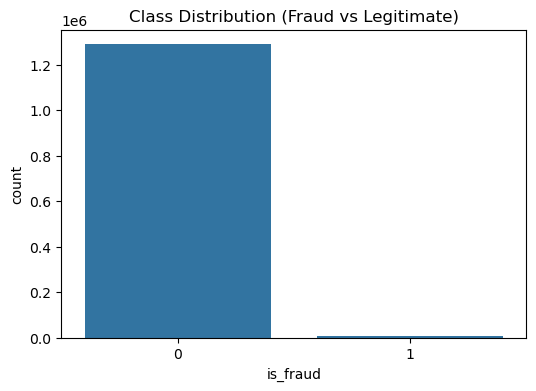

is_fraud
0    0.994211
1    0.005789
Name: proportion, dtype: float64


In [12]:
# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x="is_fraud", data=df)
plt.title("Class Distribution (Fraud vs Legitimate)")
plt.show()

print(df["is_fraud"].value_counts(normalize=True))  # Check fraud ratio


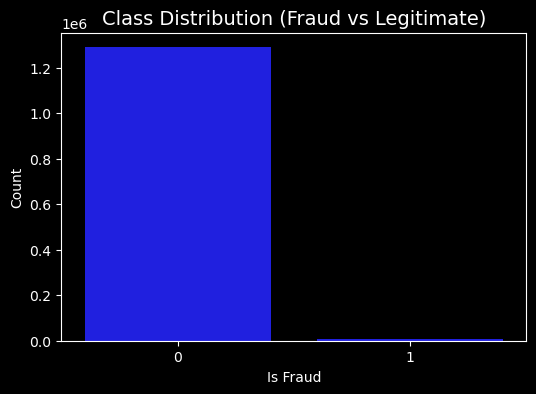

In [13]:
# Set a dark background
plt.style.use("dark_background")

# Customize plot appearance
plt.figure(figsize=(6, 4))
sns.set_palette("deep")  # Set Seaborn's color palette
sns.countplot(x="is_fraud", data=df, color="blue")  # Blue bars
plt.title("Class Distribution (Fraud vs Legitimate)", color="white", fontsize=14)  # White font for title
plt.xlabel("Is Fraud", color="white")  # White x-axis label
plt.ylabel("Count", color="white")  # White y-axis label
plt.tick_params(colors="white")  # White tick labels
plt.show()

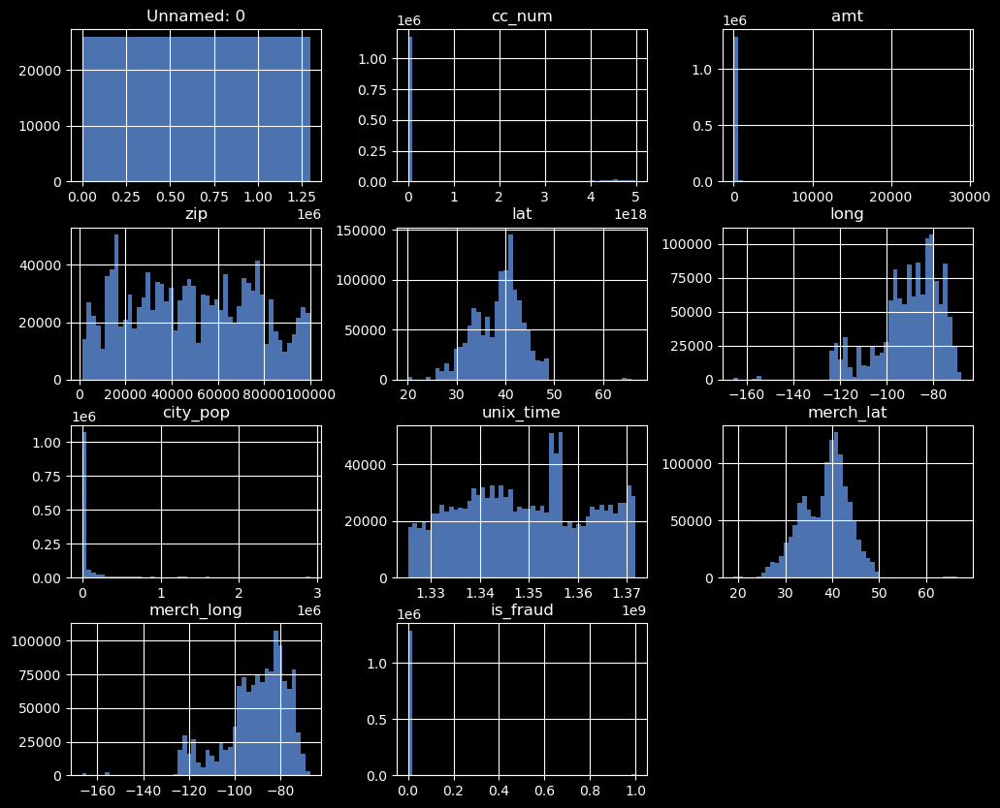

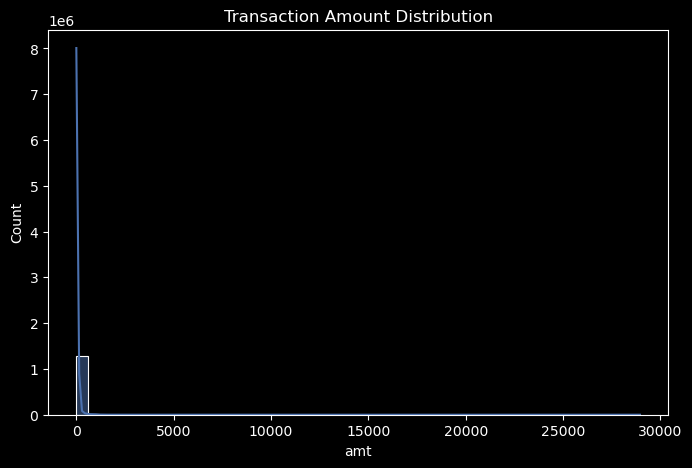

In [14]:
# Histograms for numerical features
df.hist(figsize=(12, 10), bins=50)
plt.show()

# Distribution of transaction amounts
plt.figure(figsize=(8,5))
sns.histplot(df['amt'], bins=50, kde=True)
plt.title('Transaction Amount Distribution')
plt.show()


In [15]:
import pandas as pd
import plotly.express as px

# Convert transaction time to datetime
df["trans_date_trans_time"] = pd.to_datetime(df["trans_date_trans_time"])
df["hour"] = df["trans_date_trans_time"].dt.hour
df["day"] = df["trans_date_trans_time"].dt.day
df["month"] = df["trans_date_trans_time"].dt.month

# Plot fraud transactions by hour using Plotly
fig = px.histogram(df, x="hour", color="is_fraud", barmode="group",
                   title="Fraud Transactions by Hour",
                   labels={"hour": "Hour of Day", "count": "Transaction Count", "is_fraud": "Fraud Status"},
                   category_orders={"hour": list(range(24))})  # Ensures hours are in order

# Show the plot
fig.show()


In [16]:
import pandas as pd
import plotly.express as px

# Convert transaction time to datetime
df["trans_date_trans_time"] = pd.to_datetime(df["trans_date_trans_time"])
df["hour"] = df["trans_date_trans_time"].dt.hour
df["day"] = df["trans_date_trans_time"].dt.day
df["month"] = df["trans_date_trans_time"].dt.month

# Plot fraud transactions by hour using Plotly
fig = px.histogram(df, x="hour", color="is_fraud", barmode="group",
                   title="Fraud Transactions by Hour",
                   labels={"hour": "Hour of Day", "count": "Transaction Count", "is_fraud": "Fraud Status"},
                   category_orders={"hour": list(range(24))})  # Ensures hours are in order

# Customize layout for black background and white font
fig.update_layout(
    plot_bgcolor="black",  # Plot background
    paper_bgcolor="black",  # Outer background
    font=dict(color="white"),  # Font color
    title_font=dict(color="white"),  # Title font color
    legend=dict(font=dict(color="white")),  # Legend font color
    xaxis=dict(title_font=dict(color="white"), tickfont=dict(color="white"), showgrid=False),  # X-axis styling
    yaxis=dict(title_font=dict(color="white"), tickfont=dict(color="white"), showgrid=False)  # Y-axis styling
)



# Customize bar colors
fig.update_traces(marker=dict(line=dict(color="white", width=1)))  # Bar outline in white

# Show the plot
fig.show()


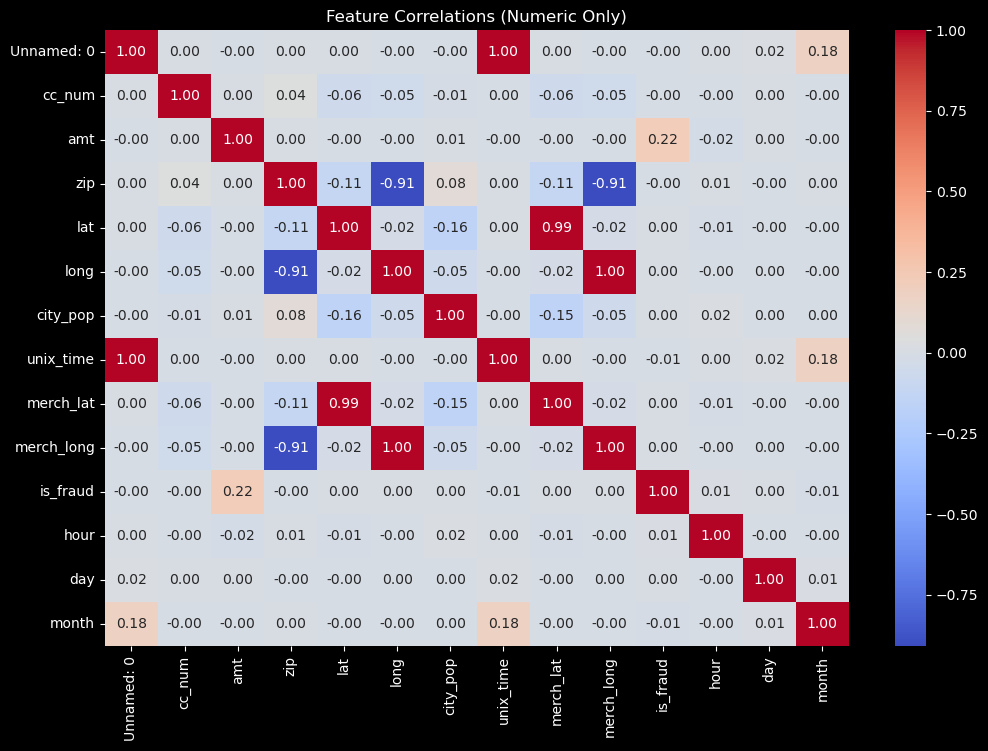

In [17]:
# Select only numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=[np.number])

# Plot heatmap
plt.figure(figsize=(12,8))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlations (Numeric Only)")
plt.show()


In [13]:
from geopy.distance import geodesic

def calculate_distance(row):
    return geodesic((row["lat"], row["long"]), (row["merch_lat"], row["merch_long"])).km

df["geo_distance"] = df.apply(calculate_distance, axis=1)


In [14]:
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,hour,day,month,geo_distance
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,1,1,78.773821
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,1,1,30.216618
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,1,1,108.102912
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,1,1,95.685115
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,1,1,77.702395


In [15]:
import plotly.express as px

# Extract day of the week (0 = Monday, 6 = Sunday)
df["day_of_week"] = df["trans_date_trans_time"].dt.dayofweek

# Create is_weekend column (1 for Saturday/Sunday, 0 otherwise)
df["is_weekend"] = (df["day_of_week"] >= 5).astype(int)  # Saturday=5, Sunday=6

# Plot fraud count on weekends vs weekdays
fig = px.histogram(df, x="is_weekend", color="is_fraud", barmode="group",
                   title="Fraud Transactions on Weekends vs Weekdays",
                   labels={"is_weekend": "Is Weekend (1=Yes, 0=No)", "count": "Transaction Count", "is_fraud": "Fraud Status"},
                   category_orders={"is_weekend": [0, 1]})  # Ensure proper order

# Show plot
fig.show()


In [16]:
#df["time_since_last_txn"] = df.groupby("cc_num")["unix_time"].diff().fillna(0)
df["dob"] = pd.to_datetime(df["dob"])
df["age"] = (df["trans_date_trans_time"] - df["dob"]).dt.days // 365

In [17]:
df.head().T

,0,1,2,3,4
Unnamed: 0,0,1,2,3,4
trans_date_trans_time,2019-01-01 00:00:18,2019-01-01 00:00:44,2019-01-01 00:00:51,2019-01-01 00:01:16,2019-01-01 00:03:06
cc_num,2703186189652095,630423337322,38859492057661,3534093764340240,375534208663984
merchant,"fraud_Rippin, Kub and Mann","fraud_Heller, Gutmann and Zieme",fraud_Lind-Buckridge,"fraud_Kutch, Hermiston and Farrell",fraud_Keeling-Crist
category,misc_net,grocery_pos,entertainment,gas_transport,misc_pos
amt,4.97,107.23,220.11,45.0,41.96
first,Jennifer,Stephanie,Edward,Jeremy,Tyler
last,Banks,Gill,Sanchez,White,Garcia
gender,F,F,M,M,M
street,561 Perry Cove,43039 Riley Greens Suite 393,594 White Dale Suite 530,9443 Cynthia Court Apt. 038,408 Bradley Rest


In [18]:
df.drop(columns=["trans_num","job","first","last", "trans_date_trans_time", "Unnamed: 0","unix_time","street","city","state","zip","merchant","cc_num","merch_lat","merch_long","lat","long"],inplace=True)

In [19]:
df.drop(columns=["dob"],inplace=True)

In [20]:
df.head().T

,0,1,2,3,4
category,misc_net,grocery_pos,entertainment,gas_transport,misc_pos
amt,4.97,107.23,220.11,45.0,41.96
gender,F,F,M,M,M
city_pop,3495,149,4154,1939,99
is_fraud,0,0,0,0,0
hour,0,0,0,0,0
day,1,1,1,1,1
month,1,1,1,1,1
geo_distance,78.773821,30.216618,108.102912,95.685115,77.702395
day_of_week,1,1,1,1,1


### Read about why label encoders are better for this

In [21]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# List of categorical columns to encode
categorical_columns = ["category", "gender"]

# Apply Label Encoding
label_encoders = {}  # Store encoders for potential decoding later

for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])  # Encode the column
    label_encoders[col] = le  # Save the encoder

df.head()




,category,amt,gender,city_pop,is_fraud,hour,day,month,geo_distance,day_of_week,is_weekend,age
0,8,4.97,0,3495,0,0,1,1,78.773821,1,0,30
1,4,107.23,0,149,0,0,1,1,30.216618,1,0,40
2,0,220.11,1,4154,0,0,1,1,108.102912,1,0,56
3,2,45.00,1,1939,0,0,1,1,95.685115,1,0,52
4,9,41.96,1,99,0,0,1,1,77.702395,1,0,32


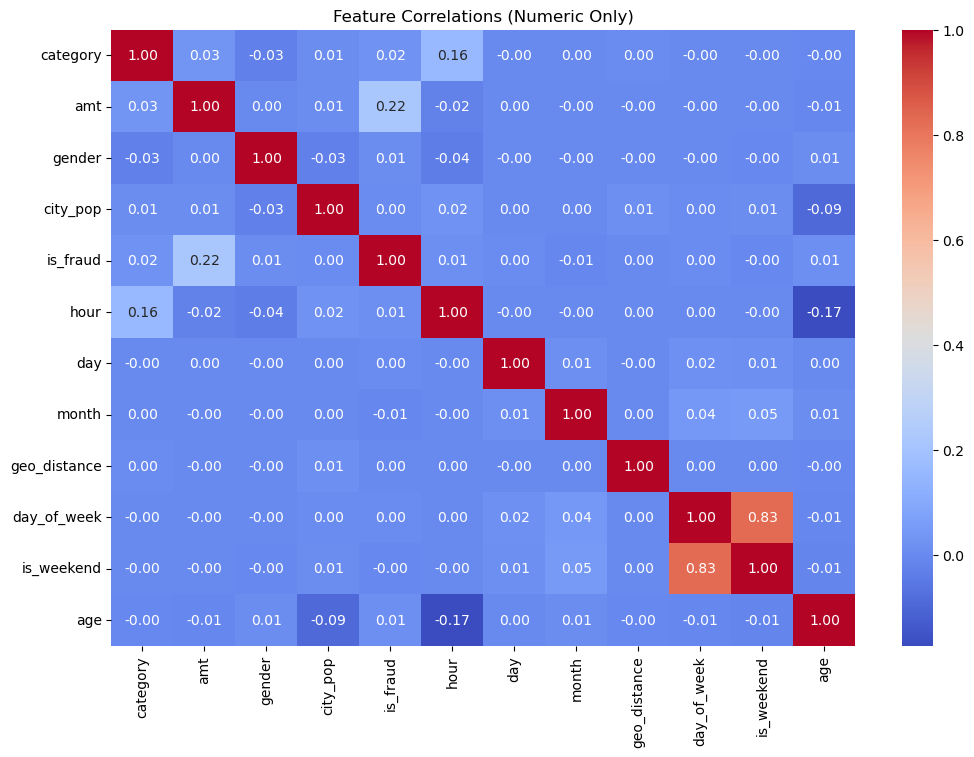

In [22]:
# Select only numeric columns for correlation matrix
numeric_df = df.select_dtypes(include=[np.number])

# Plot heatmap
plt.figure(figsize=(12,8))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlations (Numeric Only)")
plt.show()


In [23]:
df.drop(columns=["is_weekend"], inplace=True)


In [24]:
# Define Features and Target
X = df.drop(columns=["is_fraud"])  # Features
y = df["is_fraud"]  # Target

In [25]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

#### here we use scale pos weight because we have unbalanced data and we want the model to pick up on what fraudulent transactions look like

In [26]:
# Calculate class imbalance ratio
class_counts = Counter(y_train)
scale_pos_weight = class_counts[0] / class_counts[1]  # Ratio of non-fraud to fraud cases
print(f"Scale Pos Weight: {scale_pos_weight:.2f}")


Scale Pos Weight: 171.75


In [27]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)


In [29]:
# Define initial model
xgb_model = xgb.XGBClassifier(
    objective="binary:logistic",
    eval_metric="logloss",
    use_label_encoder=False,
    scale_pos_weight=scale_pos_weight,
    learning_rate=0.1,
    max_depth=6,
    n_estimators=200,
    random_state=42
)

# Train model
xgb_model.fit(X_train, y_train)


/opt/anaconda3/envs/arise_riders_2/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning:

[05:24:24] WARNING: /var/folders/c_/qfmhj66j0tn016nkx_th4hxm0000gp/T/abs_b6qk1lz_ug/croot/xgboost-split_1724073748391/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

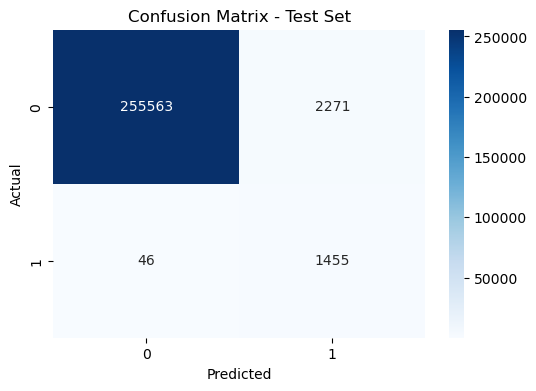


Train AUC-ROC: 0.9958233745582182
Test AUC-ROC: 0.980272885708857


In [30]:
# Predictions
y_train_pred = xgb_model.predict(X_train)
y_test_pred = xgb_model.predict(X_test)

# Confusion Matrix
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Test Set")
plt.show()

# AUC-ROC Score
print("\nTrain AUC-ROC:", roc_auc_score(y_train, y_train_pred))
print("Test AUC-ROC:", roc_auc_score(y_test, y_test_pred))


#### recall is important because we want to be sure that when we need to catch all fraudulent transactions even if it comes at the cost of more false positives.

In [31]:
precision = 1455 / (1455 + 2271)
print(f"Precision: {precision:.4f}")


Precision: 0.3905


In [32]:
recall = 1455 / (1455 + 46)
print(f"Recall: {recall:.4f}")

Recall: 0.9694


#### f1 score - the balance of precision and recall

In [33]:
f1_score = 2 * (precision * recall) / (precision + recall)
print(f"F1-Score: {f1_score:.4f}")


F1-Score: 0.5567


In [34]:
from sklearn.metrics import accuracy_score

# Compute Accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Train Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


Train Accuracy: 0.9917
Test Accuracy: 0.9911


<Figure size 1000x600 with 0 Axes>

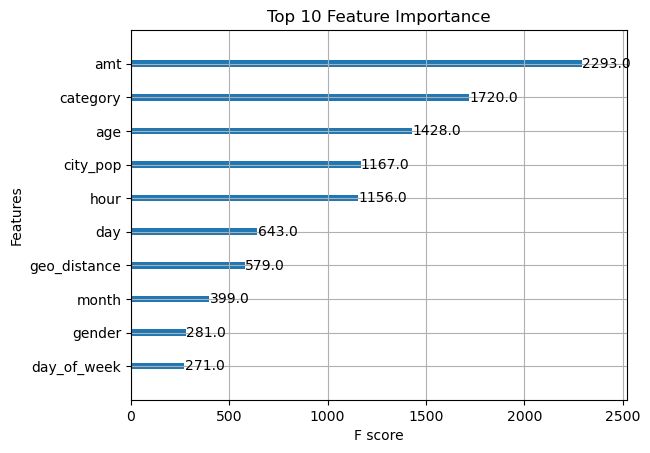

In [35]:
# Plot Feature Importance
plt.figure(figsize=(10,6))
xgb.plot_importance(xgb_model, max_num_features=10, importance_type="weight", title="Top 10 Feature Importance")
plt.show()


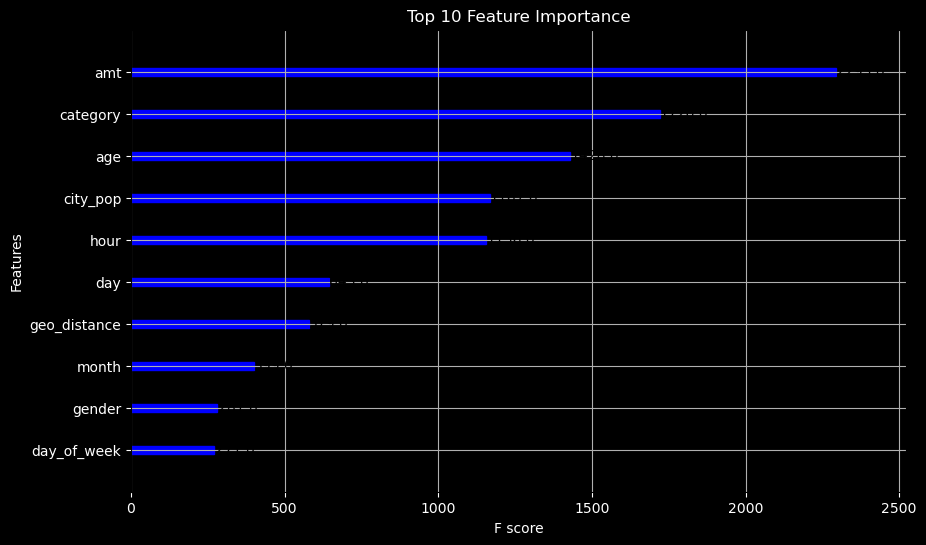

In [36]:
# Create the feature importance plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot feature importance
xgb.plot_importance(xgb_model, max_num_features=10, importance_type="weight", ax=ax, title="Top 10 Feature Importance")

# Customize the background color
fig.patch.set_facecolor('black')  # Set the figure background to black
ax.set_facecolor('black')  # Set the axes background to black

# Customize the text and ticks to white
ax.title.set_color('white')  # Title color
ax.xaxis.label.set_color('white')  # X-axis label color
ax.yaxis.label.set_color('white')  # Y-axis label color
ax.tick_params(colors='white')  # Tick labels color

# Customize the color of the bars (blue)
for bar in ax.patches:
    bar.set_color('blue')

# Display the customized plot
plt.show()


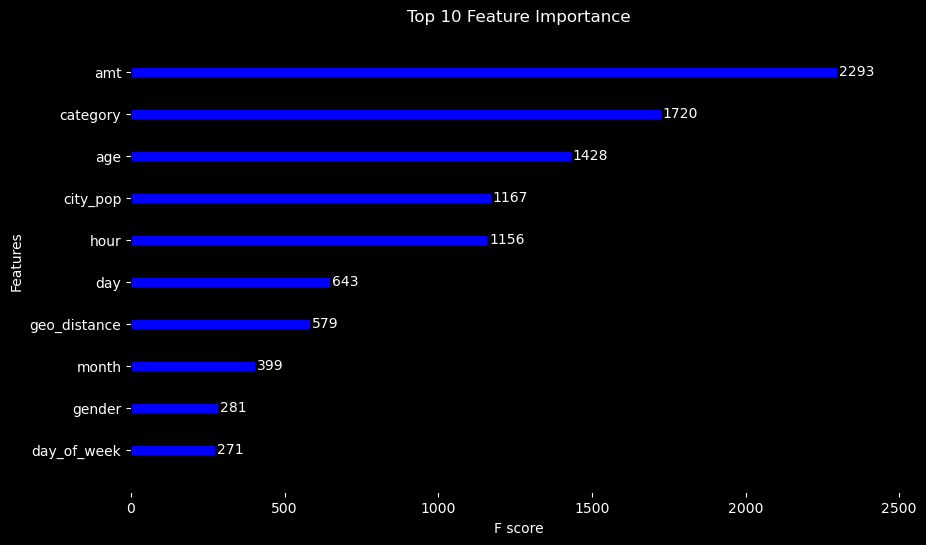

In [37]:

fig, ax = plt.subplots(figsize=(10, 6))
xgb.plot_importance(xgb_model, max_num_features=10, importance_type="weight", ax=ax, title="Top 10 Feature Importance")

# Set figure and axes backgrounds to black
fig.patch.set_facecolor('black')
ax.set_facecolor('black')

# Remove grid lines
ax.grid(False)

# Set text (title, axis labels, tick labels) to white
ax.title.set_color('white')
ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')
ax.tick_params(colors='white')

# Set bar colors to blue and adjust label colors
for bar, label in zip(ax.patches, ax.get_yticklabels()):
    bar.set_color('blue')  # Set the bar color to blue
    label.set_color('white')  # Set the y-axis label color to white

# Add white labels to the end of each bar
for bar in ax.patches:
    width = bar.get_width()  # Get the width of the bar (the importance value)
    ax.text(
        width + 10,  # Position the label slightly beyond the bar
        bar.get_y() + bar.get_height() / 2,  # Align the label vertically with the bar
        f'{int(width)}',  # Label text (e.g., the importance score)
        color='white',  # Set the text color to white
        ha='left',  # Align the text to the left of the position
        va='center'  # Align the text vertically
    )

# Display the customized plot
plt.show()
